In [ ]:
(time everything)

load all test train for tide and rerun
start with feature selection

load data for liu et al in a new notebook (start to end)
  Divide into test and train
  feature selection
  Run limma
  (FCBF, Ranger and merged rank) 

Document all hyperparameters and attach a link(google hyperparameters)
  

In [1]:
library(caret)
set.seed(64)

Loading required package: lattice

Loading required package: ggplot2



In [2]:
# feature.ranger <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.ranger.rds")

ml.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/ml.list.rds")
ranger.imp100 <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/ranger.imp100.rds")
jmim.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/jmim.list.rds")
top100var.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/top100var.list.rds")
limma86.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/limma86.list.rds")
fcbf44.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/fcbf44.list.rds")
litsur.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/litsur.list.rds")
prat.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/prat.list.rds")


mod_inp_mat <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/mod_inp_mat_AntiPD1.rds")
test <- readRDS("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/GideHugoRiaz_AntiPD1_test.rds") 


feat <- grep("[0-9]",colnames(test))
response_actual <- test$Response
response_actual[response_actual==1] <- "Y"
response_actual[response_actual==0] <- "N"
test <- test[,c(feat)]

In [3]:
control <- trainControl(method="repeatedcv", number=10, repeats=3)

# GBM

Hyperparameters
n.trees, interaction.depth, shrinkage, n.minobsinnode

[Tuning Parameters](https://www.listendata.com/2015/07/gbm-boosted-models-tuning-parameters.html)

1. n.trees – Number of trees (the number of gradient boosting iteration) i.e. N. Increasing N reduces the error on training set, but setting it too high may lead to over-fitting.

2. interaction.depth (Maximum nodes per tree) - number of splits it has to perform on a tree (starting from a single node). More than two nodes are required to detect interactions and the default six - node tree appears to do an excellent job. 
 
3. Shrinkage (Learning Rate) – It is considered as a learning rate. In the context of GBMs, shrinkage is used for reducing, or shrinking, the impact of each additional fitted base-learner (tree). It reduces the size of incremental steps and thus penalizes the importance of each consecutive iteration. The intuition behind this technique is that it is better to improve a model by taking many small steps than by taking fewer large steps. If one of the boosting iterations turns out to be erroneous, its negative impact can be easily corrected in subsequent steps.

4. n.minobsinnode - the minimum number of observations in trees' terminal nodes.

In [4]:
modelLookup('gbm')

,model,parameter,label,forReg,forClass,probModel
,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>
1,gbm,n.trees,# Boosting Iterations,TRUE,TRUE,TRUE
2,gbm,interaction.depth,Max Tree Depth,TRUE,TRUE,TRUE
3,gbm,shrinkage,Shrinkage,TRUE,TRUE,TRUE
4,gbm,n.minobsinnode,Min. Terminal Node Size,TRUE,TRUE,TRUE


In [5]:
gbmGrid <- expand.grid(interaction.depth = (1:6), n.trees = (1:6)*20, shrinkage = c(0.1, 0.08, 0.05), n.minobsinnode = c(10, 8, 5))

## Merged Rank

In [6]:
date()
feature.mergedRank <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ml.list))]
saveRDS(feature.mergedRank, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.mergedRank.rds")


gbm_mergedRank <- train(Response~., data=feature.mergedRank, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"),
                  tuneGrid = gbmGrid)
saveRDS(gbm_mergedRank, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_mergedRank.rds")
date()

[1] "Tue Aug 17 10:38:16 2021"

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3441            -nan     0.0500    0.0013
     2        1.3095            -nan     0.0500    0.0107
     3        1.2779            -nan     0.0500    0.0064
     4        1.2498            -nan     0.0500    0.0066
     5        1.2207            -nan     0.0500    0.0054
     6        1.1983            -nan     0.0500    0.0021
     7        1.1796            -nan     0.0500   -0.0014
     8        1.1498            -nan     0.0500    0.0033
     9        1.1312            -nan     0.0500    0.0024
    10        1.1090            -nan     0.0500    0.0017
    20        0.9215            -nan     0.0500    0.0027
    40        0.6781            -nan     0.0500    0.0019
    60        0.5143            -nan     0.0500   -0.0012
    80        0.3934            -nan     0.0500   -0.0012
   100        0.3100            -nan     0.0500    0.0008
   120        0.2446            -nan     0.0500   -0.0001

Iter   TrainD

[1] "Tue Aug 17 10:39:39 2021"

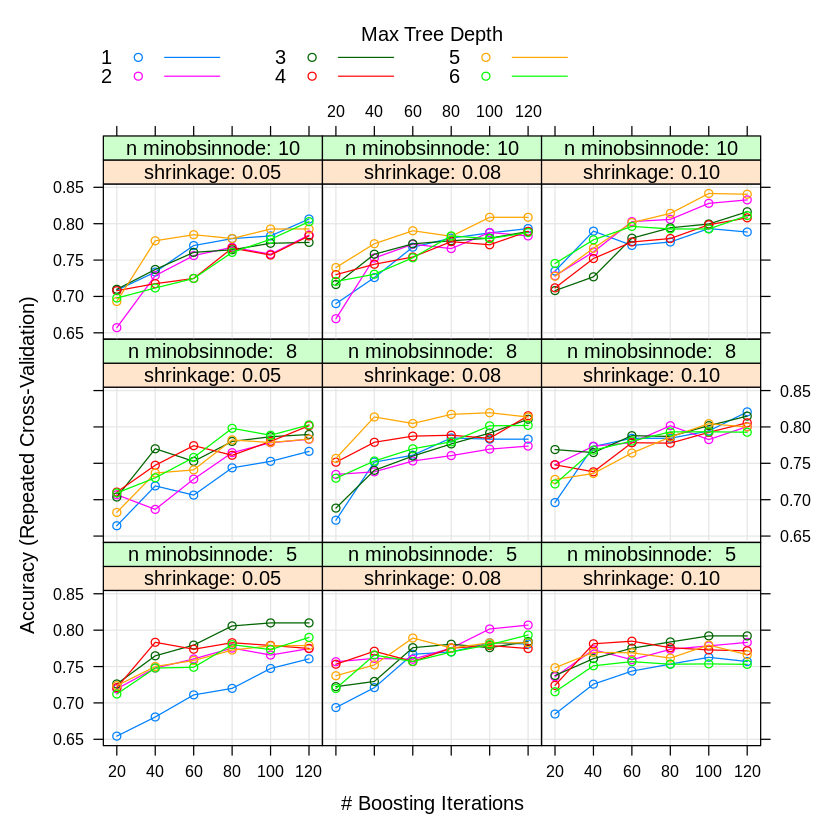

In [38]:
plot(gbm_mergedRank)

In [8]:
gbm_predictions_mergedRank <- predict(gbm_mergedRank, test)
confusionMatrix(data = gbm_predictions_mergedRank, reference = as.factor(response_actual), positive = "Y")

Confusion Matrix and Statistics

          Reference
Prediction N Y
         N 7 3
         Y 4 4
                                         
               Accuracy : 0.6111         
                 95% CI : (0.3575, 0.827)
    No Information Rate : 0.6111         
    P-Value [Acc > NIR] : 0.6017         
                                         
                  Kappa : 0.2025         
                                         
 Mcnemar's Test P-Value : 1.0000         
                                         
            Sensitivity : 0.5714         
            Specificity : 0.6364         
         Pos Pred Value : 0.5000         
         Neg Pred Value : 0.7000         
             Prevalence : 0.3889         
         Detection Rate : 0.2222         
   Detection Prevalence : 0.4444         
      Balanced Accuracy : 0.6039         
                                         
       'Positive' Class : Y              
                                         

## Random Forest Permutation (Ranger)

In [12]:
date()
feature.ranger <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))]
saveRDS(feature.ranger, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.ranger.rds")


gbm_ranger <- train(Response~., data=feature.ranger, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"),
                  tuneGrid = gbmGrid)
saveRDS(gbm_ranger, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_ranger.rds")
date()

[1] "Tue Aug 17 10:42:27 2021"

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3357            -nan     0.0500    0.0031
     2        1.2998            -nan     0.0500    0.0118
     3        1.2805            -nan     0.0500   -0.0003
     4        1.2592            -nan     0.0500    0.0009
     5        1.2305            -nan     0.0500    0.0108
     6        1.2060            -nan     0.0500    0.0036
     7        1.1812            -nan     0.0500    0.0064
     8        1.1500            -nan     0.0500    0.0130
     9        1.1294            -nan     0.0500    0.0047
    10        1.1082            -nan     0.0500    0.0031
    20        0.9332            -nan     0.0500   -0.0039
    40        0.6665            -nan     0.0500    0.0006
    60        0.4976            -nan     0.0500    0.0019
    80        0.3762            -nan     0.0500    0.0002
   100        0.2844            -nan     0.0500   -0.0012
   120        0.2163            -nan     0.0500   -0.0017

Iter   TrainD

[1] "Tue Aug 17 10:43:49 2021"

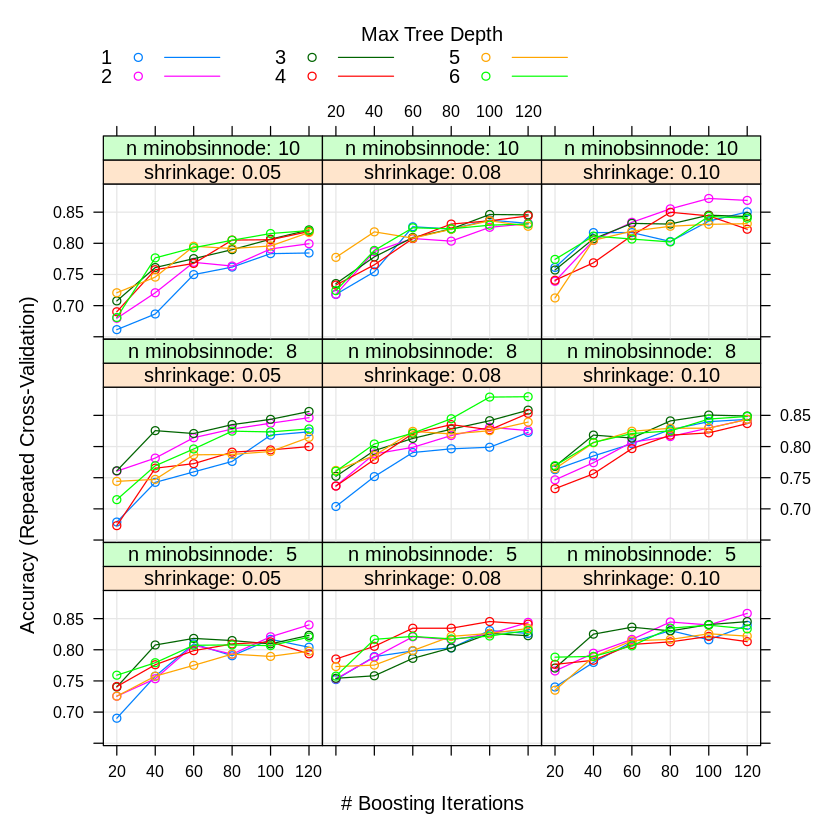

In [13]:
plot(gbm_ranger)

In [14]:
gbm_predictions_ranger <- predict(gbm_ranger, test)
confusionMatrix(data = gbm_predictions_ranger, reference = as.factor(response_actual), positive = "Y")

Confusion Matrix and Statistics

          Reference
Prediction N Y
         N 9 4
         Y 2 3
                                          
               Accuracy : 0.6667          
                 95% CI : (0.4099, 0.8666)
    No Information Rate : 0.6111          
    P-Value [Acc > NIR] : 0.4117          
                                          
                  Kappa : 0.2603          
                                          
 Mcnemar's Test P-Value : 0.6831          
                                          
            Sensitivity : 0.4286          
            Specificity : 0.8182          
         Pos Pred Value : 0.6000          
         Neg Pred Value : 0.6923          
             Prevalence : 0.3889          
         Detection Rate : 0.1667          
   Detection Prevalence : 0.2778          
      Balanced Accuracy : 0.6234          
                                          
       'Positive' Class : Y               
                                          

## Mutual Information (JMIM)

In [16]:
date()
feature.jmim <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))]
saveRDS(feature.jmim, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.jmim.rds")


gbm_jmim <- train(Response~., data=feature.jmim, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"),
                  tuneGrid = gbmGrid)
saveRDS(gbm_jmim, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_jmim.rds")
date()

[1] "Tue Aug 17 10:44:09 2021"

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3452            -nan     0.0500    0.0067
     2        1.3245            -nan     0.0500    0.0009
     3        1.3125            -nan     0.0500   -0.0069
     4        1.2886            -nan     0.0500    0.0047
     5        1.2774            -nan     0.0500   -0.0035
     6        1.2627            -nan     0.0500    0.0019
     7        1.2453            -nan     0.0500    0.0008
     8        1.2276            -nan     0.0500    0.0018
     9        1.2078            -nan     0.0500    0.0041
    10        1.1800            -nan     0.0500    0.0113
    20        1.0122            -nan     0.0500   -0.0002
    40        0.8048            -nan     0.0500    0.0035
    60        0.6626            -nan     0.0500   -0.0038
    80        0.5427            -nan     0.0500   -0.0012
   100        0.4452            -nan     0.0500   -0.0005
   120        0.3698            -nan     0.0500    0.0001

Iter   TrainD

[1] "Tue Aug 17 10:45:31 2021"

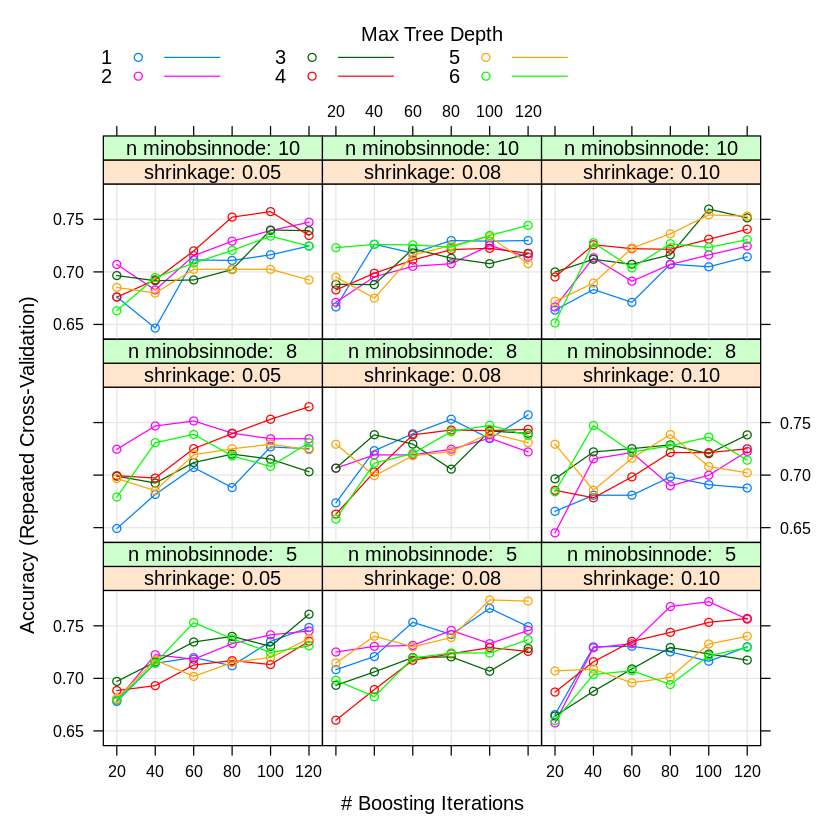

In [17]:
plot(gbm_jmim)

In [18]:
gbm_predictions_jmim <- predict(gbm_jmim, test)
confusionMatrix(data = gbm_predictions_jmim, reference = as.factor(response_actual), positive = "Y")

Confusion Matrix and Statistics

          Reference
Prediction N Y
         N 8 5
         Y 3 2
                                          
               Accuracy : 0.5556          
                 95% CI : (0.3076, 0.7847)
    No Information Rate : 0.6111          
    P-Value [Acc > NIR] : 0.7680          
                                          
                  Kappa : 0.0137          
                                          
 Mcnemar's Test P-Value : 0.7237          
                                          
            Sensitivity : 0.2857          
            Specificity : 0.7273          
         Pos Pred Value : 0.4000          
         Neg Pred Value : 0.6154          
             Prevalence : 0.3889          
         Detection Rate : 0.1111          
   Detection Prevalence : 0.2778          
      Balanced Accuracy : 0.5065          
                                          
       'Positive' Class : Y               
                                          

## Variance

In [19]:
date()
feature.var100 <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))]
saveRDS(feature.var100, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.var100.rds")


gbm_var100 <- train(Response~., data=feature.var100, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"),
                  tuneGrid = gbmGrid)
saveRDS(gbm_var100, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_var100.rds")
date()

[1] "Tue Aug 17 10:45:32 2021"

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3489            -nan     0.0500   -0.0006
     2        1.3301            -nan     0.0500    0.0027
     3        1.3182            -nan     0.0500   -0.0024
     4        1.3027            -nan     0.0500   -0.0016
     5        1.2907            -nan     0.0500   -0.0022
     6        1.2728            -nan     0.0500   -0.0009
     7        1.2506            -nan     0.0500    0.0072
     8        1.2307            -nan     0.0500   -0.0029
     9        1.2207            -nan     0.0500   -0.0071
    10        1.2030            -nan     0.0500    0.0042
    20        1.0701            -nan     0.0500    0.0019
    40        0.8890            -nan     0.0500   -0.0012
    60        0.7742            -nan     0.0500    0.0001
    80        0.6627            -nan     0.0500   -0.0009
   100        0.5651            -nan     0.0500   -0.0006
   120        0.4958            -nan     0.0500   -0.0007

Iter   TrainD

[1] "Tue Aug 17 10:46:55 2021"

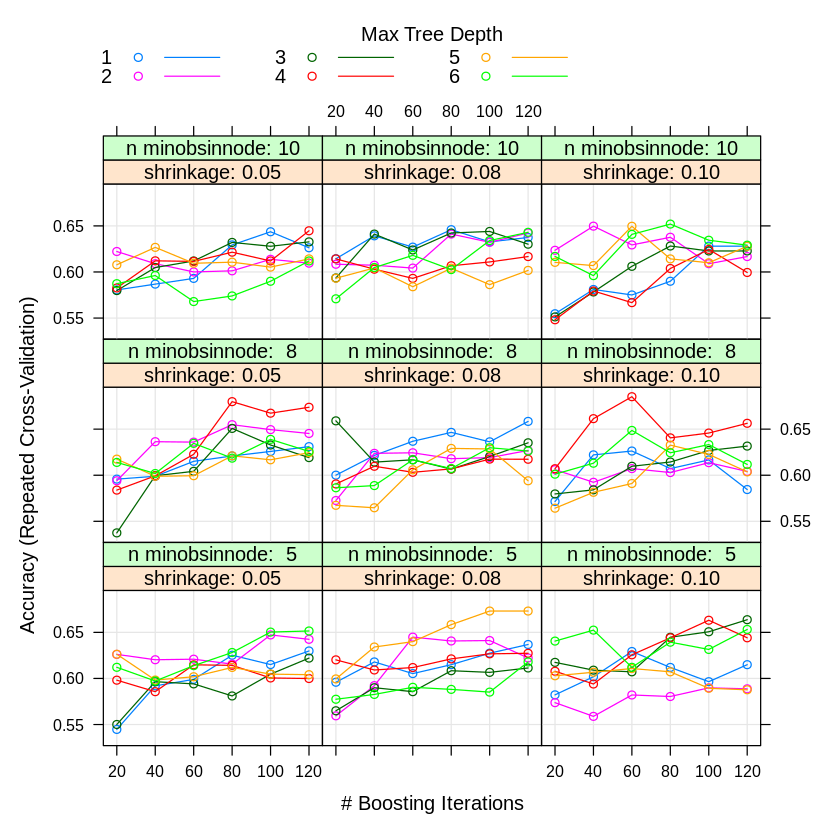

In [20]:
plot(gbm_var100)

In [21]:
gbm_predictions_var100 <- predict(gbm_var100, test)
confusionMatrix(data = gbm_predictions_var100, reference = as.factor(response_actual), positive = "Y")

Confusion Matrix and Statistics

          Reference
Prediction N Y
         N 8 4
         Y 3 3
                                         
               Accuracy : 0.6111         
                 95% CI : (0.3575, 0.827)
    No Information Rate : 0.6111         
    P-Value [Acc > NIR] : 0.6017         
                                         
                  Kappa : 0.16           
                                         
 Mcnemar's Test P-Value : 1.0000         
                                         
            Sensitivity : 0.4286         
            Specificity : 0.7273         
         Pos Pred Value : 0.5000         
         Neg Pred Value : 0.6667         
             Prevalence : 0.3889         
         Detection Rate : 0.1667         
   Detection Prevalence : 0.3333         
      Balanced Accuracy : 0.5779         
                                         
       'Positive' Class : Y              
                                         

## Limma

In [22]:
date()
feature.limma86 <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))]
saveRDS(feature.limma86, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.limma86.rds")


gbm_limma86 <- train(Response~., data=feature.limma86, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"),
                  tuneGrid = gbmGrid)
saveRDS(gbm_limma86, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_limma86.rds")
date()

[1] "Tue Aug 17 10:46:55 2021"

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3409            -nan     0.0500    0.0048
     2        1.3200            -nan     0.0500    0.0049
     3        1.2987            -nan     0.0500    0.0043
     4        1.2845            -nan     0.0500   -0.0056
     5        1.2685            -nan     0.0500   -0.0004
     6        1.2481            -nan     0.0500    0.0008
     7        1.2334            -nan     0.0500   -0.0046
     8        1.2175            -nan     0.0500   -0.0029
     9        1.2005            -nan     0.0500    0.0041
    10        1.1823            -nan     0.0500   -0.0009
    20        1.0029            -nan     0.0500    0.0003
    40        0.7697            -nan     0.0500   -0.0031
    60        0.6050            -nan     0.0500   -0.0028
    80        0.4874            -nan     0.0500   -0.0004
   100        0.4001            -nan     0.0500   -0.0008
   120        0.3283            -nan     0.0500   -0.0031

Iter   TrainD

[1] "Tue Aug 17 10:48:01 2021"

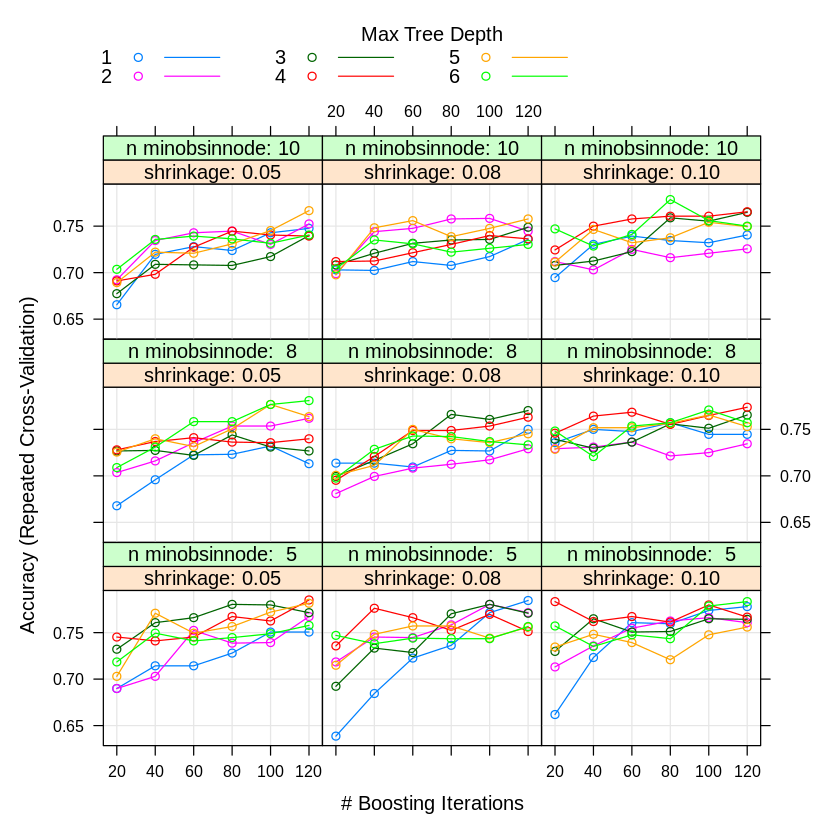

In [23]:
plot(gbm_limma86)

In [24]:
gbm_predictions_limma86 <- predict(gbm_limma86, test)
confusionMatrix(data = gbm_predictions_limma86, reference = as.factor(response_actual), positive = "Y")

Confusion Matrix and Statistics

          Reference
Prediction N Y
         N 9 3
         Y 2 4
                                          
               Accuracy : 0.7222          
                 95% CI : (0.4652, 0.9031)
    No Information Rate : 0.6111          
    P-Value [Acc > NIR] : 0.2375          
                                          
                  Kappa : 0.4             
                                          
 Mcnemar's Test P-Value : 1.0000          
                                          
            Sensitivity : 0.5714          
            Specificity : 0.8182          
         Pos Pred Value : 0.6667          
         Neg Pred Value : 0.7500          
             Prevalence : 0.3889          
         Detection Rate : 0.2222          
   Detection Prevalence : 0.3333          
      Balanced Accuracy : 0.6948          
                                          
       'Positive' Class : Y               
                                          

## FCBF

In [25]:
date()
feature.fcbf44 <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))]
saveRDS(feature.fcbf44, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.fcbf44.rds")


gbm_fcbf44 <- train(Response~., data=feature.fcbf44, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"),
                  tuneGrid = gbmGrid)
saveRDS(gbm_fcbf44, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_fcbf44.rds")
date()

[1] "Tue Aug 17 10:48:45 2021"

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3393            -nan     0.0500    0.0053
     2        1.3125            -nan     0.0500    0.0089
     3        1.2856            -nan     0.0500    0.0064
     4        1.2689            -nan     0.0500   -0.0046
     5        1.2537            -nan     0.0500    0.0006
     6        1.2268            -nan     0.0500    0.0075
     7        1.2053            -nan     0.0500    0.0020
     8        1.1882            -nan     0.0500    0.0036
     9        1.1696            -nan     0.0500    0.0010
    10        1.1520            -nan     0.0500   -0.0022
    20        0.9562            -nan     0.0500    0.0058
    40        0.7309            -nan     0.0500    0.0051
    60        0.5693            -nan     0.0500   -0.0028
    80        0.4561            -nan     0.0500    0.0022
   100        0.3628            -nan     0.0500    0.0008
   120        0.2964            -nan     0.0500   -0.0002

Iter   TrainD

[1] "Tue Aug 17 10:49:29 2021"

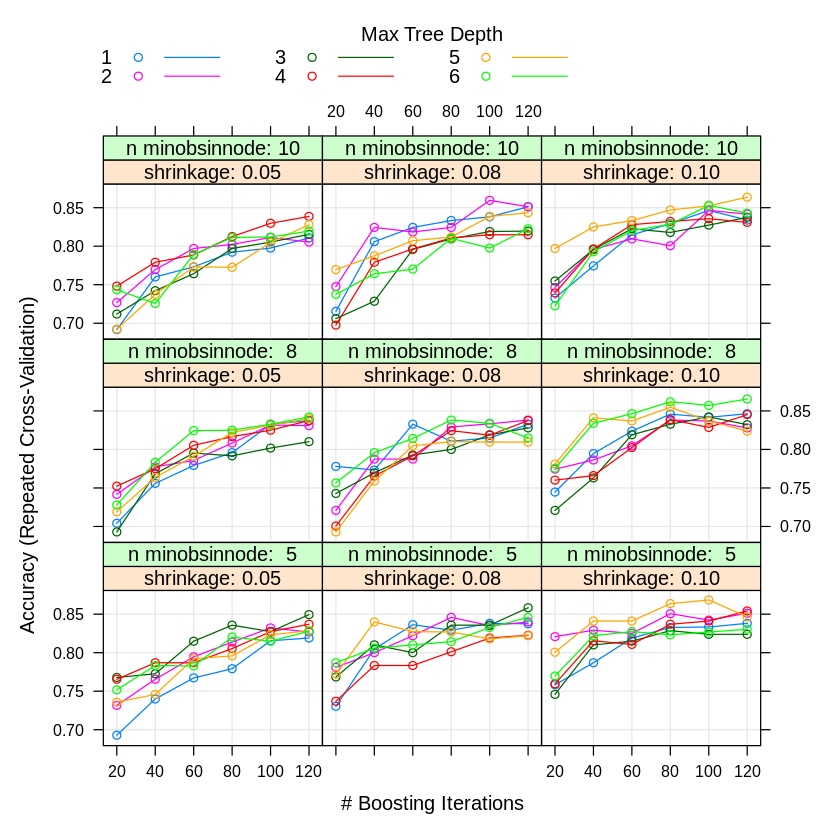

In [26]:
plot(gbm_fcbf44)

In [27]:
gbm_predictions_fcbf44 <- predict(gbm_fcbf44, test)
confusionMatrix(data = gbm_predictions_fcbf44, reference = as.factor(response_actual), positive = "Y")

Confusion Matrix and Statistics

          Reference
Prediction  N  Y
         N 10  2
         Y  1  5
                                          
               Accuracy : 0.8333          
                 95% CI : (0.5858, 0.9642)
    No Information Rate : 0.6111          
    P-Value [Acc > NIR] : 0.04023         
                                          
                  Kappa : 0.64            
                                          
 Mcnemar's Test P-Value : 1.00000         
                                          
            Sensitivity : 0.7143          
            Specificity : 0.9091          
         Pos Pred Value : 0.8333          
         Neg Pred Value : 0.8333          
             Prevalence : 0.3889          
         Detection Rate : 0.2778          
   Detection Prevalence : 0.3333          
      Balanced Accuracy : 0.8117          
                                          
       'Positive' Class : Y               
                                    

## Literature Review

In [28]:
date()
feature.litsur <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", litsur.list))]
saveRDS(feature.litsur, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.litsur.rds")


gbm_litsur <- train(Response~., data=feature.litsur, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"),
                  tuneGrid = gbmGrid)
saveRDS(gbm_litsur, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_litsur.rds")
date()

[1] "Tue Aug 17 10:49:39 2021"

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3494            -nan     0.0500   -0.0055
     2        1.3231            -nan     0.0500    0.0059
     3        1.3024            -nan     0.0500    0.0043
     4        1.2860            -nan     0.0500    0.0008
     5        1.2692            -nan     0.0500    0.0050
     6        1.2505            -nan     0.0500    0.0041
     7        1.2361            -nan     0.0500    0.0012
     8        1.2203            -nan     0.0500    0.0019
     9        1.2021            -nan     0.0500    0.0054
    10        1.1868            -nan     0.0500    0.0027
    20        1.0715            -nan     0.0500   -0.0013
    40        0.8968            -nan     0.0500   -0.0026
    60        0.7506            -nan     0.0500    0.0016
    80        0.6432            -nan     0.0500    0.0006
   100        0.5553            -nan     0.0500   -0.0011
   120        0.4887            -nan     0.0500   -0.0009

Iter   TrainD

[1] "Tue Aug 17 10:50:23 2021"

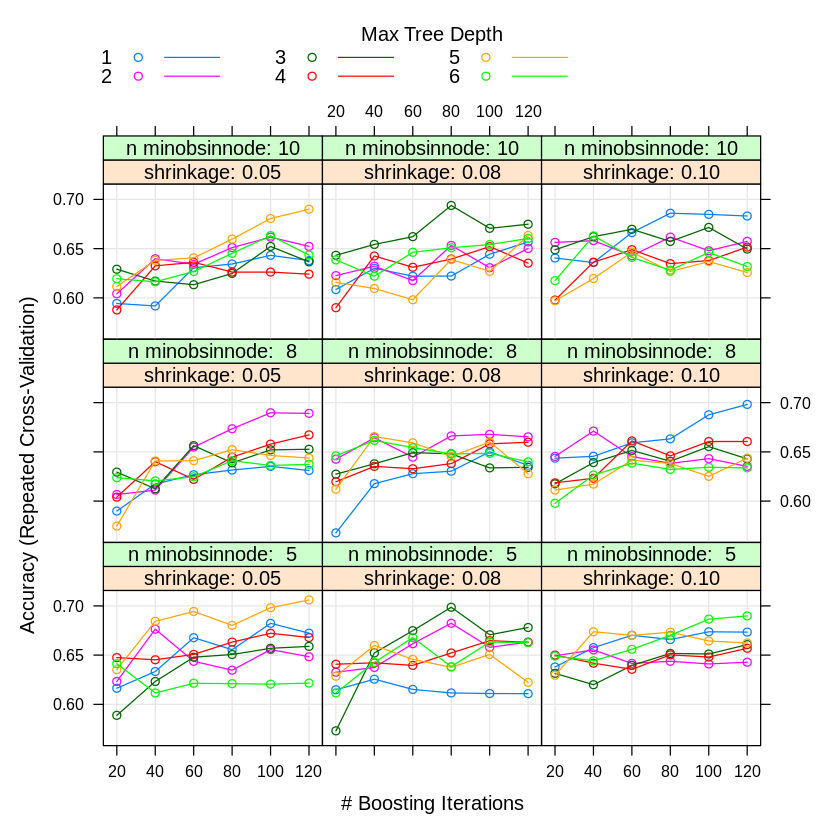

In [29]:
plot(gbm_litsur)

In [30]:
gbm_predictions_litsur <- predict(gbm_litsur, test)
confusionMatrix(data = gbm_predictions_litsur, reference = as.factor(response_actual), positive = "Y")

Confusion Matrix and Statistics

          Reference
Prediction N Y
         N 8 3
         Y 3 4
                                          
               Accuracy : 0.6667          
                 95% CI : (0.4099, 0.8666)
    No Information Rate : 0.6111          
    P-Value [Acc > NIR] : 0.4117          
                                          
                  Kappa : 0.2987          
                                          
 Mcnemar's Test P-Value : 1.0000          
                                          
            Sensitivity : 0.5714          
            Specificity : 0.7273          
         Pos Pred Value : 0.5714          
         Neg Pred Value : 0.7273          
             Prevalence : 0.3889          
         Detection Rate : 0.2222          
   Detection Prevalence : 0.3889          
      Balanced Accuracy : 0.6494          
                                          
       'Positive' Class : Y               
                                          

## Prat et al.

In [31]:
date()
feature.prat <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))]
saveRDS(feature.prat, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.prat.rds")


gbm_prat <- train(Response~., data=feature.prat, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"),
                  tuneGrid = gbmGrid)
saveRDS(gbm_prat, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_prat.rds")
date()

[1] "Tue Aug 17 10:50:23 2021"

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3444            -nan     0.0500    0.0041
     2        1.3317            -nan     0.0500   -0.0089
     3        1.3178            -nan     0.0500   -0.0060
     4        1.2966            -nan     0.0500    0.0006
     5        1.2785            -nan     0.0500   -0.0015
     6        1.2627            -nan     0.0500    0.0002
     7        1.2458            -nan     0.0500   -0.0030
     8        1.2260            -nan     0.0500    0.0041
     9        1.2111            -nan     0.0500    0.0021
    10        1.1950            -nan     0.0500    0.0019
    20        1.0791            -nan     0.0500   -0.0033
    40        0.8589            -nan     0.0500   -0.0020
    60        0.7012            -nan     0.0500   -0.0034
    80        0.5633            -nan     0.0500   -0.0006
   100        0.4663            -nan     0.0500   -0.0006
   120        0.3892            -nan     0.0500   -0.0012

Iter   TrainD

[1] "Tue Aug 17 10:57:47 2021"

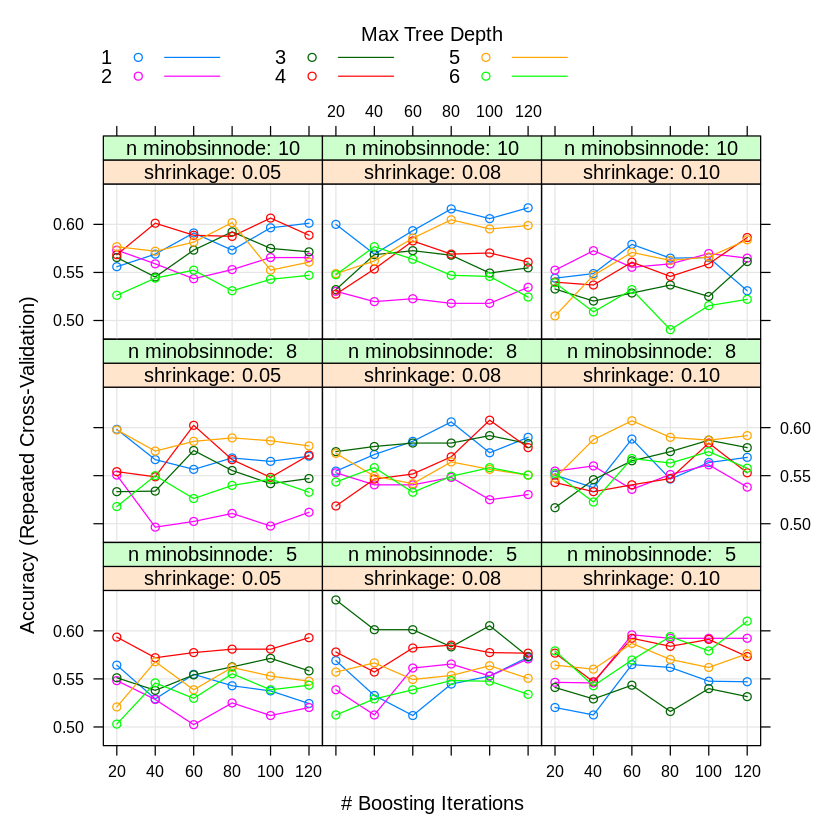

In [32]:
plot(gbm_prat)

In [33]:
gbm_predictions_prat <- predict(gbm_prat, test)
confusionMatrix(data = gbm_predictions_prat, reference = as.factor(response_actual), positive = "Y")

Confusion Matrix and Statistics

          Reference
Prediction N Y
         N 9 5
         Y 2 2
                                         
               Accuracy : 0.6111         
                 95% CI : (0.3575, 0.827)
    No Information Rate : 0.6111         
    P-Value [Acc > NIR] : 0.6017         
                                         
                  Kappa : 0.1127         
                                         
 Mcnemar's Test P-Value : 0.4497         
                                         
            Sensitivity : 0.2857         
            Specificity : 0.8182         
         Pos Pred Value : 0.5000         
         Neg Pred Value : 0.6429         
             Prevalence : 0.3889         
         Detection Rate : 0.1111         
   Detection Prevalence : 0.2222         
      Balanced Accuracy : 0.5519         
                                         
       'Positive' Class : Y              
                                         

# Best Hyperparameters

In [42]:
gbm_mergedRank$bestTune
gbm_var100$bestTune
gbm_fcbf44$bestTune
gbm_limma86$bestTune
gbm_ranger$bestTune
gbm_jmim$bestTune
gbm_litsur$bestTune
gbm_prat$bestTune

,n.trees,interaction.depth,shrinkage,n.minobsinnode
,<dbl>,<int>,<dbl>,<dbl>
305,100,5,0.1,10


,n.trees,interaction.depth,shrinkage,n.minobsinnode
,<dbl>,<int>,<dbl>,<dbl>
279,60,4,0.1,8


,n.trees,interaction.depth,shrinkage,n.minobsinnode
,<dbl>,<int>,<dbl>,<dbl>
293,100,5,0.1,5


,n.trees,interaction.depth,shrinkage,n.minobsinnode
,<dbl>,<int>,<dbl>,<dbl>
60,120,4,0.05,5


,n.trees,interaction.depth,shrinkage,n.minobsinnode
,<dbl>,<int>,<dbl>,<dbl>
210,120,6,0.08,8


,n.trees,interaction.depth,shrinkage,n.minobsinnode
,<dbl>,<int>,<dbl>,<dbl>
185,100,5,0.08,5


,n.trees,interaction.depth,shrinkage,n.minobsinnode
,<dbl>,<int>,<dbl>,<dbl>
78,120,5,0.05,5


,n.trees,interaction.depth,shrinkage,n.minobsinnode
,<dbl>,<int>,<dbl>,<dbl>
145,20,3,0.08,5


In [ ]:
overlap <- length(Reduce(intersect,    list(
#                                             ml.list
#                                             ,fcbf44.list 
#                                             ,top100var.list
#                                             ,limma8.list
#                                             ,ranger.imp200
#                                             ,jmim.list
#                                             ,as.character(genes_lit_rawdata)
#                                             ,prat.list
                                           )))